In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv('/content/Iris.csv')
df

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
4,5,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...,...
145,146,6.7,3.0,5.2,2.3,Iris-virginica
146,147,6.3,2.5,5.0,1.9,Iris-virginica
147,148,6.5,3.0,5.2,2.0,Iris-virginica
148,149,6.2,3.4,5.4,2.3,Iris-virginica


In [ ]:
df.shape

(150, 6)

# Sampling

## Random Sampling

In [ ]:
# create a random sample of size 150 with 70% zeros and 30% ones
# in order to select randomly some registers from df
np.random.seed(2345)
samples = np.random.choice(a=[0,1], size=150, replace=True, p=[0.7, 0.3])

print(len(samples))
print(len(samples[samples == 0]))
print(len(samples[samples == 1]))

samples

150
101
49


array([0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0,
       0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1])

In [ ]:
# filtering df according to the random sampling. It will select only zero positions
df_filtered = df.loc[samples == 0]
print(df_filtered.shape)
df_filtered.head()

(101, 6)


,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
5,6,5.4,3.9,1.7,0.4,Iris-setosa


## Sistematic Sampling

For instance: Select an element after n counts.

In [ ]:
from math import ceil

In [ ]:
population_size =  df.count()[0]
population_size

150

In [ ]:
sample_size = 15
# we should extract one element each k elements in order to get a sample of size 15
k = ceil(population_size/sample_size)
k 

10

In [ ]:
# get the first element randomly from 1 to k
r = np.random.randint(low=1, high=k+1, size=1)
r

array([3])

In [ ]:
pos = r[0]
pos

3

In [ ]:
selected_positions = []
for i in range(sample_size):
  selected_positions.append(pos)
  pos += k
selected_positions

[3, 13, 23, 33, 43, 53, 63, 73, 83, 93, 103, 113, 123, 133, 143]

In [ ]:
seleted_sample = df.loc[selected_positions]
print(seleted_sample.shape)
seleted_sample.head()

(15, 6)


,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
3,4,4.6,3.1,1.5,0.2,Iris-setosa
13,14,4.3,3.0,1.1,0.1,Iris-setosa
23,24,5.1,3.3,1.7,0.5,Iris-setosa
33,34,5.5,4.2,1.4,0.2,Iris-setosa
43,44,5.0,3.5,1.6,0.6,Iris-setosa


## Stratified Sampling

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
df['Species'].value_counts()

Iris-setosa        50
Iris-versicolor    50
Iris-virginica     50
Name: Species, dtype: int64

In [ ]:
df.iloc[:, 5]

0         Iris-setosa
1         Iris-setosa
2         Iris-setosa
3         Iris-setosa
4         Iris-setosa
            ...      
145    Iris-virginica
146    Iris-virginica
147    Iris-virginica
148    Iris-virginica
149    Iris-virginica
Name: Species, Length: 150, dtype: object

In [ ]:
# The Sklearn train_test_split function helps us create our training data and test data.
# It returns X_train, y_train, X_test, y_test, where X are the features and y the target/predictor.
# https://www.sharpsightlabs.com/blog/scikit-train_test_split/ 
# df.iloc[0:5]: all columns excluding class
# df.iloc[:5]: class column
# test_size=0.5 means 50% of the data is going to be used on the test dataset
# stratify: stratify sample based on the class/group column
x, _, y, _ = train_test_split(df.iloc[:, 0:5],
                              df.iloc[:, 5],
                              test_size=0.5,
                              stratify=df.iloc[:, 5])
                              
y.value_counts()                      

Iris-setosa        25
Iris-versicolor    25
Iris-virginica     25
Name: Species, dtype: int64

# Metrics

In [ ]:
from scipy import stats

## Describe

In [ ]:
stats.describe(df['SepalLengthCm'])

DescribeResult(nobs=150, minmax=(4.3, 7.9), mean=5.843333333333334, variance=0.6856935123042507, skewness=0.3117530585022963, kurtosis=-0.5735679489249765)

## Mean

In [ ]:
np.mean(df['SepalLengthCm'])

5.843333333333334

## Median

In [ ]:
np.median(df['SepalLengthCm'])

5.8

## Quantiles

In [ ]:
np.quantile(df['SepalLengthCm'], [0, 0.25, 0.5, 0.75, 1])

array([4.3, 5.1, 5.8, 6.4, 7.9])

## Standard Deviation

In [ ]:
# ddof: degrees of freedom
np.std(df['SepalLengthCm'], ddof=1)

0.828066127977863

# Distributions

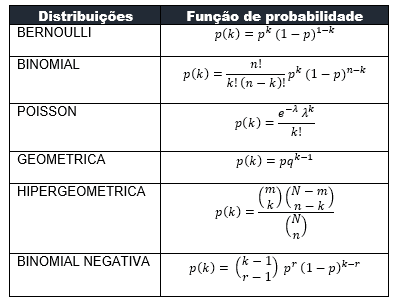

In [ ]:
Image('/content/distribuicao-no-r.png', width=400)

## Normal Distribution

In [ ]:
from scipy.stats import norm
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

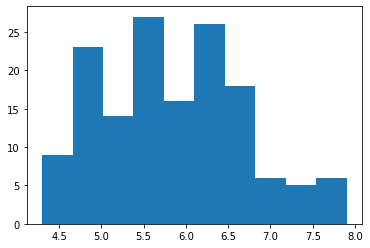

In [ ]:
# Distribution of not standardized data

plt.hist(df['SepalLengthCm'])
plt.show()

In [ ]:
df_array = df['SepalLengthCm'].values.reshape(-1,1)
df_array[0:10]

array([[5.1],
       [4.9],
       [4.7],
       [4.6],
       [5. ],
       [5.4],
       [4.6],
       [5. ],
       [4.4],
       [4.9]])

In [ ]:
# standardize data (Z normalization)
scale= StandardScaler()
sepals_size_normalized = scale.fit_transform(df_array) 
print(sepals_size_normalized[0:10])

[[-0.90068117]
 [-1.14301691]
 [-1.38535265]
 [-1.50652052]
 [-1.02184904]
 [-0.53717756]
 [-1.50652052]
 [-1.02184904]
 [-1.74885626]
 [-1.14301691]]


In [ ]:
sepals_size_normalized.reshape(-1)[0:10]

array([-0.90068117, -1.14301691, -1.38535265, -1.50652052, -1.02184904,
       -0.53717756, -1.50652052, -1.02184904, -1.74885626, -1.14301691])

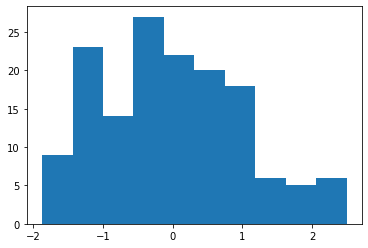

In [ ]:
# Distribution of the standardized data

plt.hist(sepals_size_normalized.reshape(-1))
plt.show()

In [ ]:
# cdf() function calculates the probability for a given normal distribution value (probabilities at left side)
# sf() Survival Function (1-cdf) (probabilities at right side)
# ppf() function calculates the normal distribution value for which a given probability 

In [ ]:
# get probability get a sepal of size lower than 6 according to the sample mean and std
norm.cdf(6, 
         np.mean(df['SepalLengthCm']), 
         np.std(df['SepalLengthCm'], ddof=1))

0.5750303360115021

In [ ]:
# cdf(x < val)
# ex: get propbability get a sepal of size higher than 6 according to the sample mean and std
1 - norm.cdf(6, 
         np.mean(df['SepalLengthCm']), 
         np.std(df['SepalLengthCm'], ddof=1))

0.4249696639884979

In [ ]:
# alternative function
norm.sf(6, np.mean(df['SepalLengthCm']), np.std(df['SepalLengthCm'], ddof=1))

0.4249696639884979

In [ ]:
# cdf(x > val)
# ex: get propbability get a sepal of size higher than 6 according to the sample mean and std
1 - norm.cdf(6, 
             np.mean(df['SepalLengthCm']), 
             np.std(df['SepalLengthCm'], ddof=1))

In [ ]:
# cdf(v1 < x < v2)
# ex: 
mean = np.mean(df['SepalLengthCm'])
std = np.std(df['SepalLengthCm'], ddof=1)
norm.cdf(7, mean, std) - norm.cdf(6, mean, std)

0.3437371434644142

In [ ]:
# cdf(x < v1 ou x > v2 )
# ex: get propbability get a sepal of size lower than 6 and higher than 7 according to the sample mean and std
mean = np.mean(df['SepalLengthCm'])
std = np.std(df['SepalLengthCm'], ddof=1)
norm.cdf(6, mean, std) + norm.sf(7, mean, std)

0.6562628565355858

In [ ]:
import math
from scipy import stats
A = stats.norm(3, math.sqrt(16)) # Declare A to be a normal random variable
print(A.pdf(4))      # f(3), the probability density at 3
print(A.cdf(2))       # F(2), which is also P(Y < 2)

0.09666702920071232
0.4012936743170763
4.695926199035007


### Normality Test

#### QQ Plot

In [ ]:
from scipy import stats
from scipy.stats import norm
from numpy.random import normal
import matplotlib.pyplot as plt

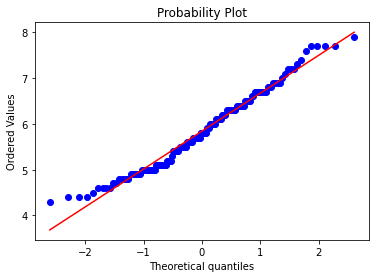

In [ ]:
# QQ PLOT
fig, ax = plt.subplots()
stats.probplot(df['SepalLengthCm'],
               fit=True,
               plot=ax)
plt.show()

In [ ]:
# Shapiro Wilk Test (https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.shapiro.html)
# The Shapiro-Wilk test tests the null hypothesis that the data was drawn from a normal distribution.
# Since the p-value is less than .05, we succeded in reject the null hypothesis that the distribution is normal.
# So the the sample corresponds to a non-normally distributed data.

shapiro_test = stats.shapiro(df['SepalLengthCm'])
print(shapiro_test)
print(shapiro_test.statistic)
print(shapiro_test.pvalue)

ShapiroResult(statistic=0.9760899543762207, pvalue=0.01018026564270258)
0.9760899543762207
0.01018026564270258


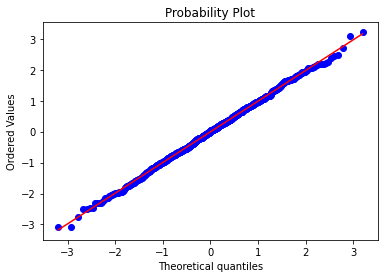

In [ ]:
# Here we simulate a normally distributed data in order to compare the Shapiro results. 

normal_data = normal(loc=0, scale=1, size=1000)

fig, ax = plt.subplots()
stats.probplot(normal_data,
               fit=True,
               plot=ax)
plt.show()

#### Shapiro-Wilk

In [ ]:
shapiro_test = stats.shapiro(normal_data)
print(shapiro_test)
print(shapiro_test.statistic)
print(shapiro_test.pvalue)

ShapiroResult(statistic=0.9990710020065308, pvalue=0.907213568687439)
0.9990710020065308
0.907213568687439


### Variance Test (Levene)

O teste de Levene tem como hipóteses: 
- H0: os grupos apresentam variâncias homogêneas 
- H1: os grupos não apresentam variâncias homogêneas

Modos de teste disponíveis no stats.levene:
- ‘median’: recommended for skewed distributions.
- ‘mean’: recommended for symmetric, moderate-tailed distributions.
- ‘trimmed’: recommended for heavy-tailed distributions.

In [ ]:
# Example
import scipy.stats as stats

group1 = [7, 14, 14, 13, 12, 9, 6, 14, 12, 8]
group2 = [15, 17, 13, 15, 15, 13, 9, 12, 10, 8]
group3 = [6, 8, 8, 9, 5, 14, 13, 8, 10, 9]

#Levene's test centered at the median
test_based_on_median = stats.levene(group1, group2, group3, center='median')
print('test_based_on_median', test_based_on_median)

#Levene's test centered at the mean
test_based_on_mean =stats.levene(group1, group2, group3, center='mean')
print('test_based_on_mean', test_based_on_mean)

# interpretation: the three groups have equal variances because we fail to reject the H0.

test_based_on_median LeveneResult(statistic=0.17981072555205047, pvalue=0.8364205218185946)
test_based_on_mean LeveneResult(statistic=0.5357011635027553, pvalue=0.5913510184735677)


## Binomial Distribution
Usada para calcular probabilidade de eventos discretos (contagens).

É preciso ter um número pré-definido de experimentos (independentes) cujos resultados são apenas dois (sucesso/fracasso, true/false). A probabilidade de sucesso devem ser iguais em cada experimento.

Considere:
- p: probabilidade de sucesso
- 1-p: probabilidade de fracasso
- n: número de experimentos
- X: total de sucessos

Exemplo de problema: Qual a probabilidade de obter cara 3 vezes (X) se uma moeda for jogada 5 vezes (n), sabendo que a probabilidade de sair cara é 50% (p)?


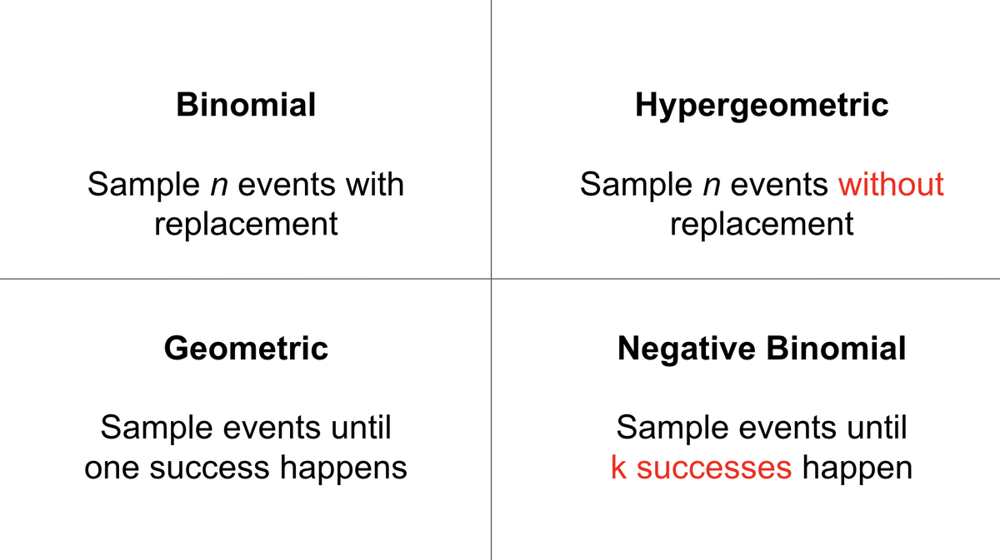

In [ ]:
Image('/content/comparison.png', width=400)

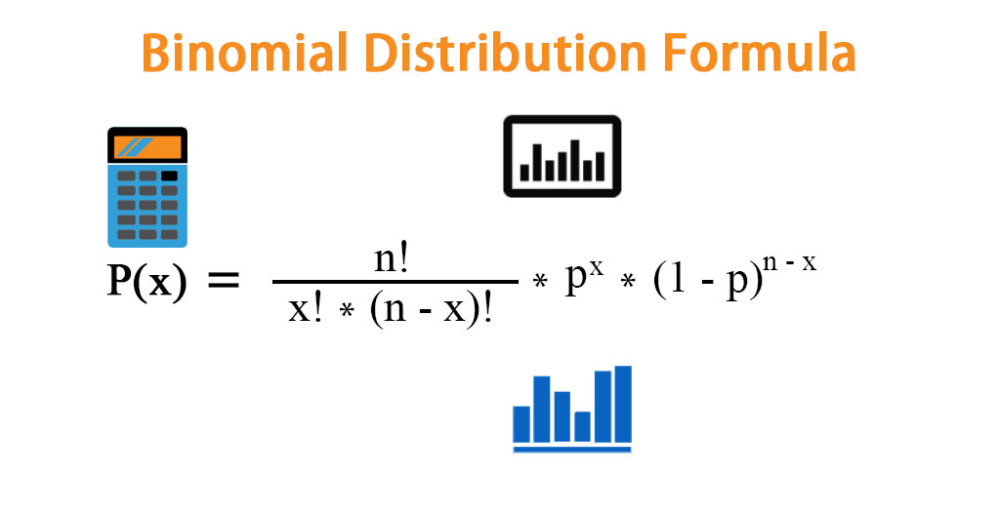

In [ ]:
Image('/content/binomal_dist.jpeg', width=500)

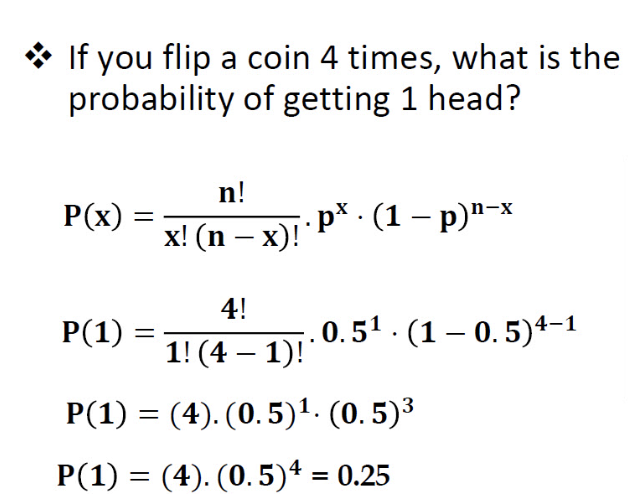

In [ ]:
# Exemplo
Image('/content/Captura de Tela 2023-04-02 às 12.07.24.png', width=250)

In [ ]:
from scipy import stats
X = stats.binom(10, 0.2) # Declare X to be a binomial random variable
print(X.pmf(3))          # P(X = 3)
print(X.cdf(4))          # P(X <= 4)
print(X.mean())          # E[X]
print(X.var())           # Var(X)
print(X.std())           # Std(X)
print(X.rvs())           # Get a random sample from X
print(X.rvs(10))         # Get 10 random samples 

0.20132659199999992
0.9672065024
2.0
1.6
1.2649110640673518
2
[2 3 2 3 3 1 0 1 1 1]


In [ ]:
# with python
# https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.binom.html
from scipy.stats import binom
n = 4
p = 0.5
n_successes = 1

# calculate binomial probability calling the pmf (prob. mass function)
binom.pmf(k=n_successes, n=n, p=p)

0.25

In [ ]:
# Outro exemplo
from scipy.stats import binom

# considere 5 jogadas de moeda. qual a probabilidade de obter 3 caras?
print(binom.pmf(k=2, n=5, p=0.5))

# em uma prova com 12 questoes com 4 alternativas, qual a probabilidade de acertar 7 questoes?
print(binom.pmf(k=7, n=10, p=0.25))

# Ao passar por 4 semáforos, qual a probabilidade de pegar nenhum, 1, 2 ou 3 abertos?
print(binom.cdf(3, 4, 0.25)) # cumulative distribution 

0.31249999999999983
0.0030899047851562496
0.99609375


## Poisson Distribution

Busca encontrar a probabilidade da ocorrência de um evento baseada na probabilidade média da ocorrência desse evento em outras ocasiões, isto é, intervalos de tempo.


Por ex, Dado que minha esposa me traiu 4 vezes no ano passado, qual a probabilidade de eu ser traído esse ano?

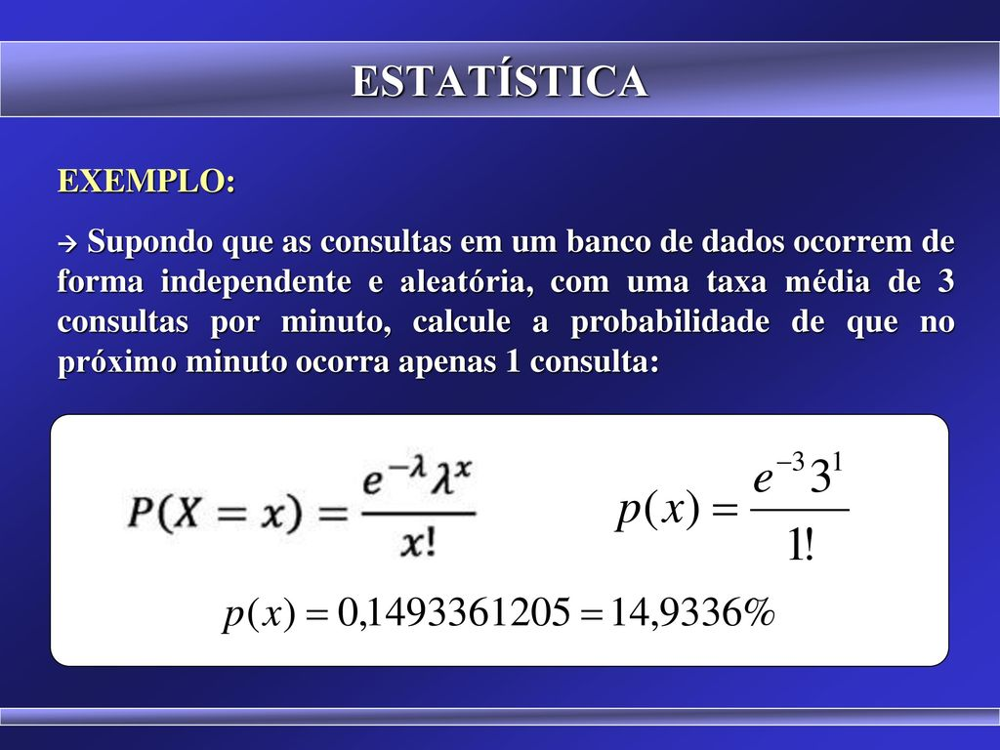

In [ ]:
from IPython.display import Image
# lambda é o número médio conhecido:
# x a quantidade que deseja estimar a probabilidade
# e é o número de Euler que vale ~ 2,71828
Image('/content/poisson.jpeg', width=400)

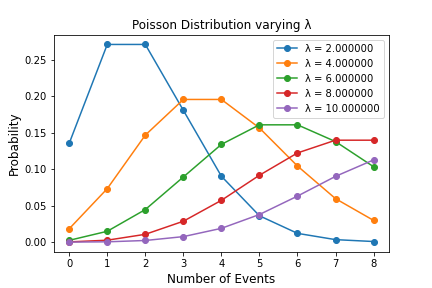

In [ ]:
# Gráfico da distribuição para diferentes médias
Image('/content/poisson_chart.png', width=400)

In [ ]:
from scipy import stats
Y = stats.poisson(3) # Declare Y to be a poisson random variable
print(Y.pmf(1))      # P(Y = 3)
print(Y.rvs())      # Get a random sample from Y

0.14936120510359185
3


In [ ]:
# https://pyshark.com/poisson-distribution-and-poisson-process-in-python/#poisson-pmf-probability-mass-function-in-python
from scipy.stats import poisson

k = 1
mu = 3
pmf = poisson.pmf(k, mu=mu)
pmf

0.14936120510359185

In [ ]:
# Outro exemplo
from scipy.stats import poisson

accidents_mean = 2

# qual a probabilidade de ocorrerem tres acidentes?
print(poisson.pmf(3,accidents_mean))

# qual a probabilidade de ocorrerem tres ou menos acidentes?
print(poisson.cdf(3,accidents_mean)) # lado esquerdo da distribuição

# qual a probabilidade de ocorrerem mais de 3 acidentes (nao inclui o 3) ?
print(poisson.sf(3,accidents_mean)) # lado direito da distribuição

0.18044704431548356
0.857123460498547
0.14287653950145296


## T-Student Distribution
Usar quando você só tem o desvio-padrão amostral e a amostra é pequena (<30). Quando a amostra é grande, se assemelha à distribuição normal.
Graus de liberdade adotado: N amostral - 1

https://www.youtube.com/watch?v=tI6mdx3s0zk

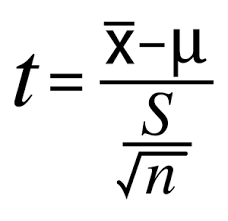

In [ ]:
# t value calc
Image('/content/t_test.png', width=100)

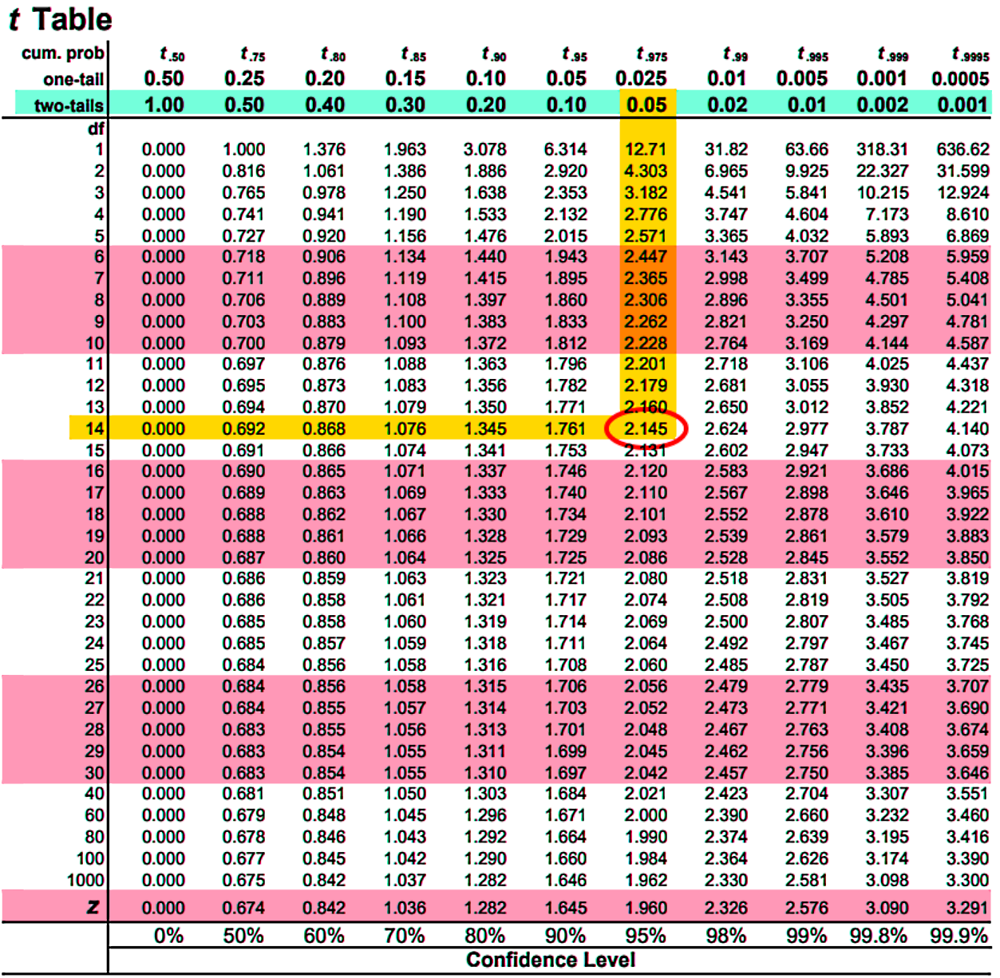

In [ ]:
Image('/content/t_student_table.png', width=500)

## Geometric Distribution

Repete-se o evento até obter sucesso.

https://www.youtube.com/watch?v=jhfGeIsQ_SA


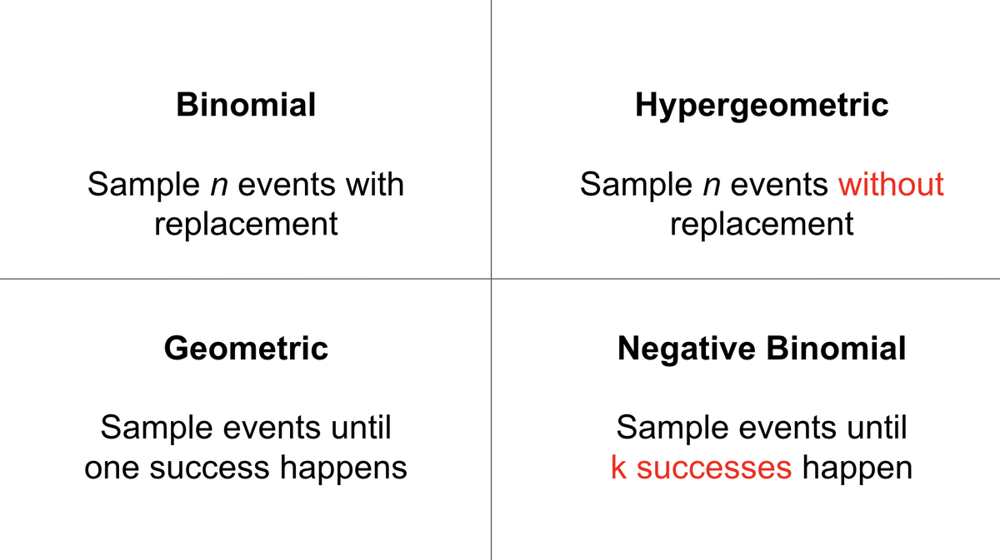

In [ ]:
Image('/content/comparison.png', width=400)

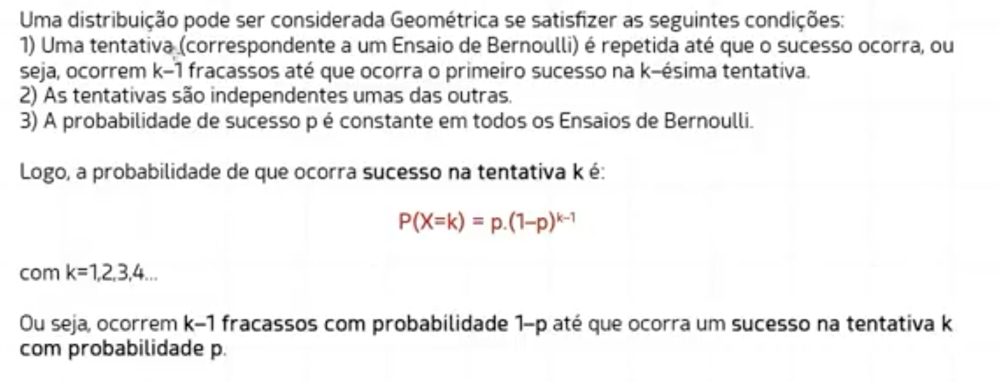

In [ ]:
Image('/content/geometric.16.58.png', width=500)

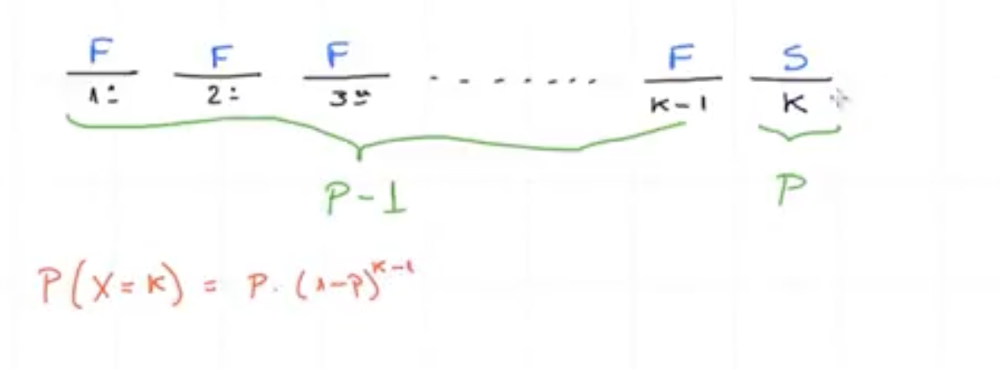

In [ ]:
Image('/content/Captura de Tela 2023-03-30 às 21.20.04.png', width=500)

In [ ]:
from scipy import stats
X = stats.geom(0.75) # Declare X to be a geometric random variable          
print(X.pmf(3))      # P(X = 3)
print(X.rvs(size=10)) # Get a random sample

0.046875
[1 1 1 2 3 1 1 1 1 2]


In [ ]:
from scipy.stats import geom
#https://www.alphacodingskills.com/scipy/scipy-geometric-distribution.php
X = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
p = 0.6

geom_pd = geom.pmf(X, p)
geom_pd

array([6.000000e-01, 2.400000e-01, 9.600000e-02, 3.840000e-02,
       1.536000e-02, 6.144000e-03, 2.457600e-03, 9.830400e-04,
       3.932160e-04, 1.572864e-04])

## Hipergeometric Distribution

https://www.youtube.com/watch?v=BCeFgnh6A1U

Envolve tentativas sem reposição, ou seja, os eventos não são independentes porque as probabilidades mudam, dependendo do que for sorteado anteriormente.


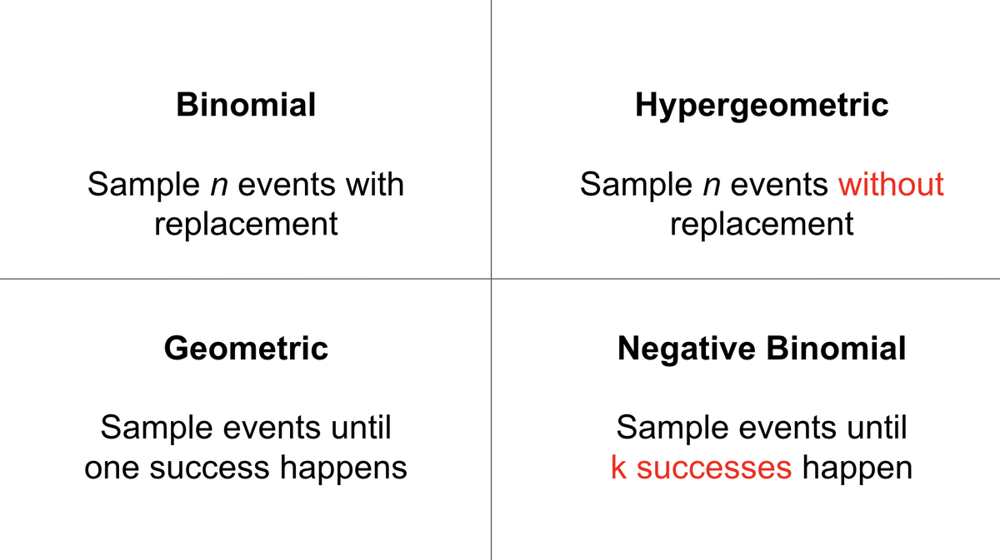

In [ ]:
Image('/content/comparison.png', width=400)

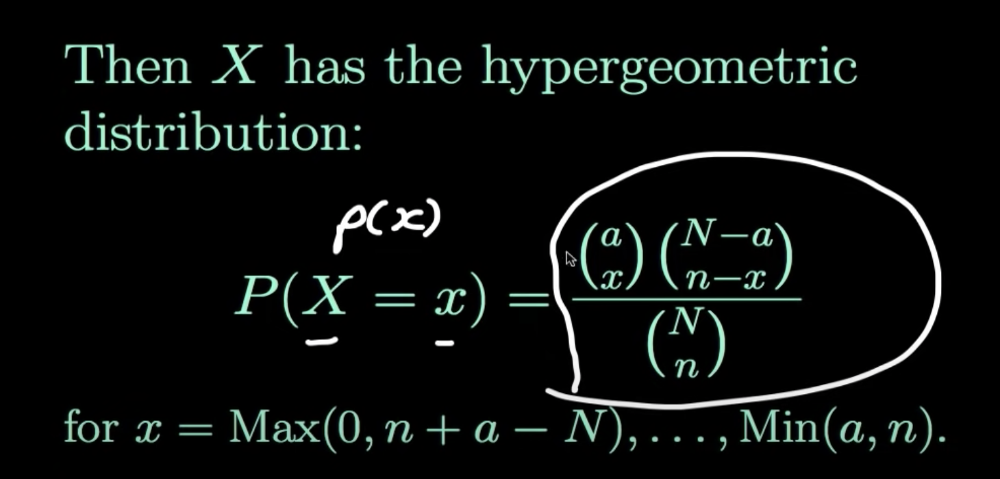

In [ ]:
Image('/content/hiper_geo.png', width=400)

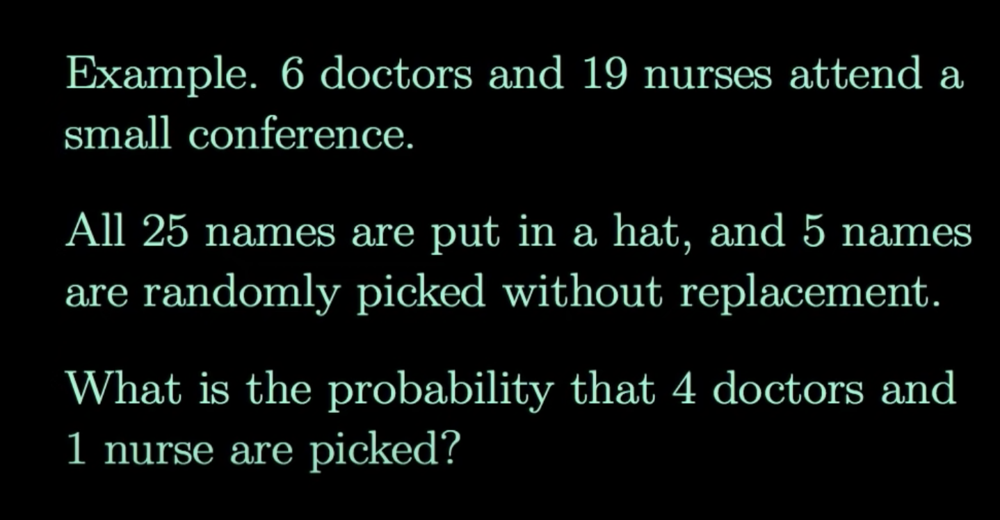

In [ ]:
Image('/content/hiper_geo_ex0.png', width=400)

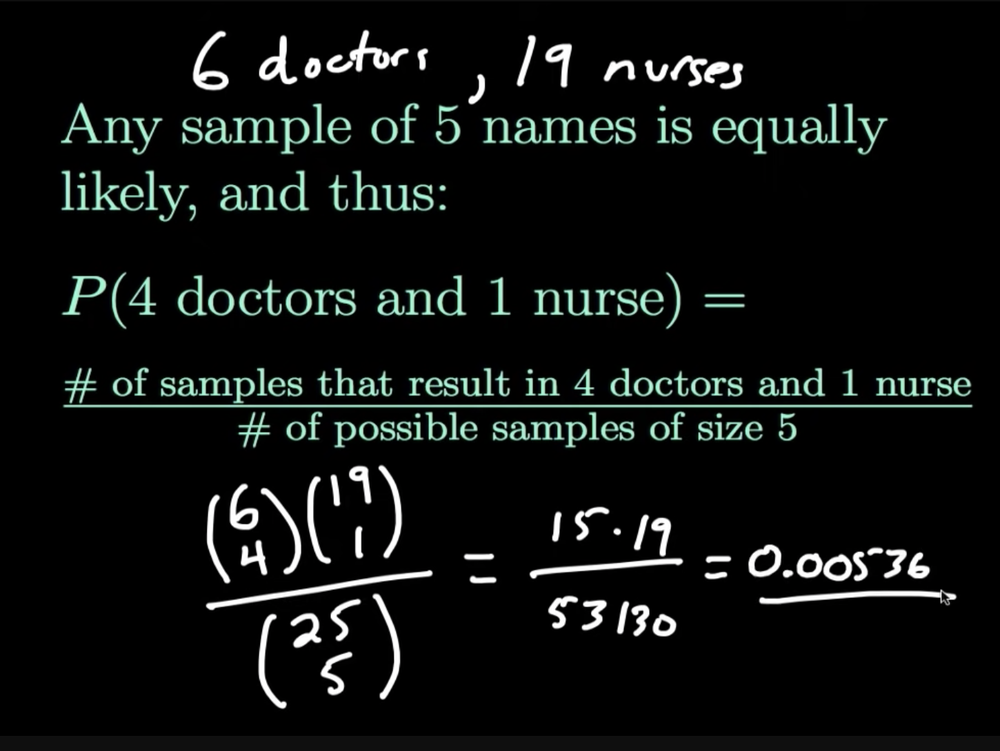

In [ ]:
Image('/content/hiper_geo_ex.png', width=400)

In [ ]:
from scipy.stats import hypergeom
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.hypergeom.html

M = 25  # Total number of people
n = 6   # Number of doctors
N = 5   # Number of people in the selected group
k = 4   # Number of doctors we want

# Find the chance that the group contains 4 doctors and 1 nurse
hpd = hypergeom(M, n, N)
hpd.pmf(k)

0.00536420101637493

## Negative Binomial Distribution

Models the number of trails needed to achieve a fixed number of successes.

Diferentemente da distr. geométrica, que se limita ao primeiro sucesso, com a dist. binomial negativa, podemos obter o número de tentativas necessárias para que se consiga ter dois sucessos, por exemplo.

https://www.youtube.com/watch?v=BPlmjp2ymxw


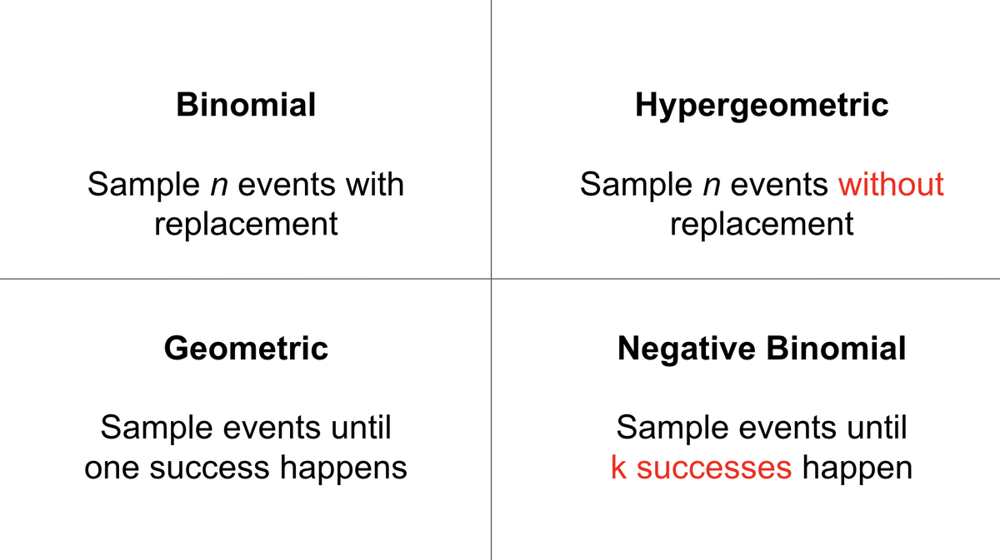

In [ ]:
Image('/content/comparison.png', width=400)

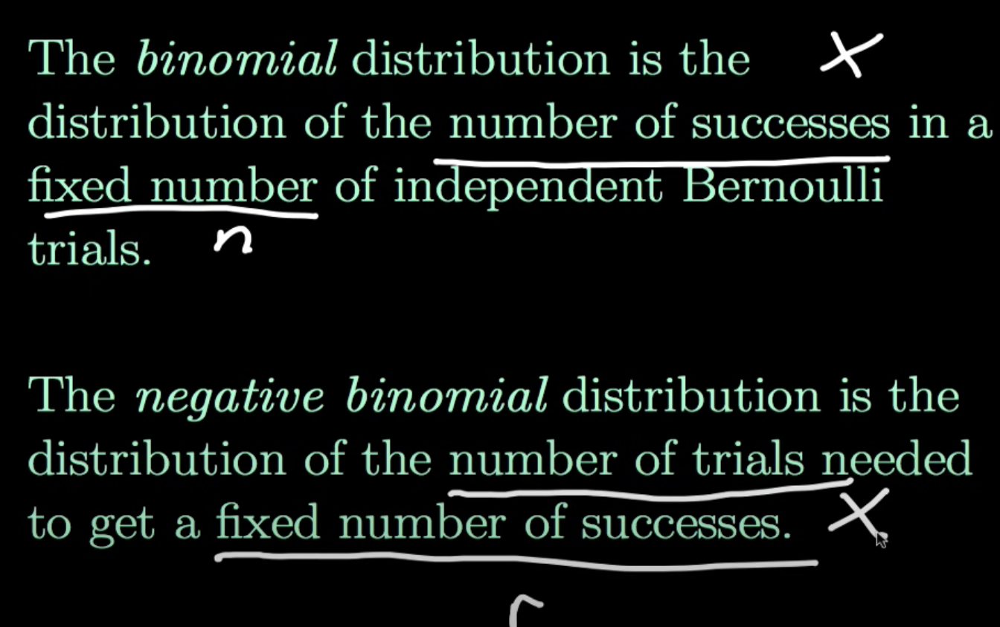

In [ ]:
Image('/content/binomial_vs_negative_binomial.png', width=400)

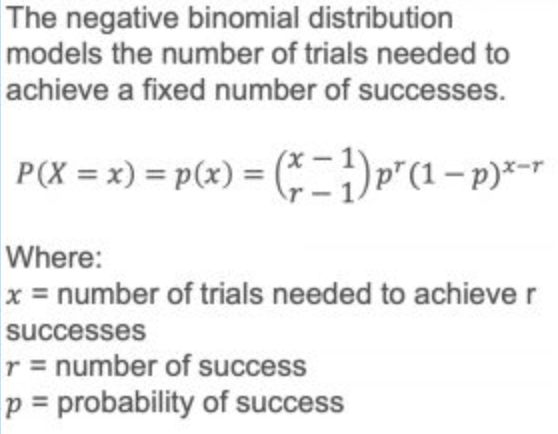

In [ ]:
Image('/content/Captura de Tela 2023-04-02 às 12.04.50.png', width=250)

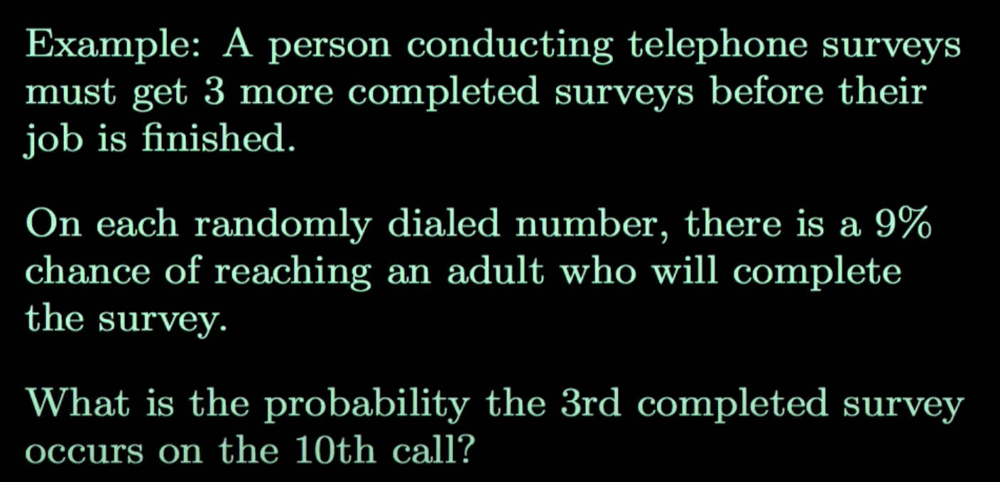

In [ ]:
Image('/content/negative_binomial.png', width=300)

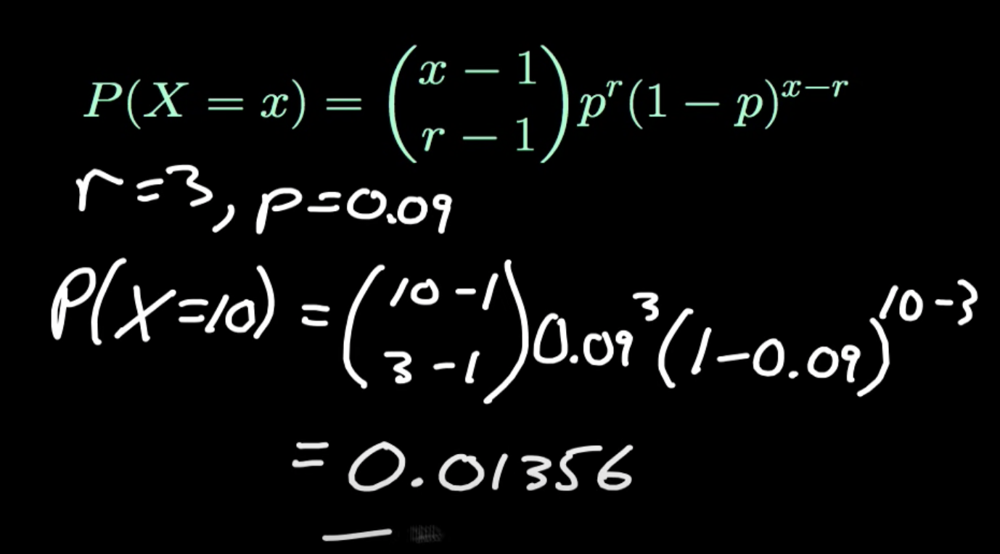

In [ ]:
Image('/content/Captura de Tela 2023-04-02 às 12.03.42.png', width=300)

In [ ]:
# https://anton-granik.medium.com/fitting-and-visualizing-a-negative-binomial-distribution-in-python-3cc27fbc7ecf
from scipy.stats import nbinom

X = 7
r = 3
p = 0.09 # probability of successful survey call

#nbinom.pmf(num_failures, num_successes, prob_of_success)
nbinom_pd = nbinom.pmf(X, r, p)
nbinom_pd

0.013561876192013244

# Confidence Intervals

Lembrando que:

- variância da população = soma((x-média)ˆ2/n)
- variância da amostra = soma((x-média)ˆ2/n-1)
- desvio-padrão = raiz variância
- Z = (x - média)/desvio-padrão



In [ ]:
from IPython.display import Image

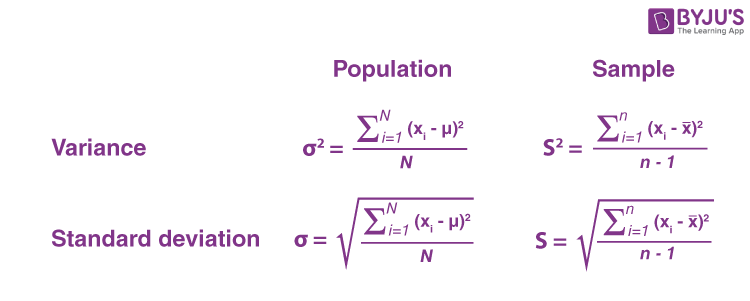

In [ ]:
Image('/content/Variance-and-Standard-Deviation.png', width=500)

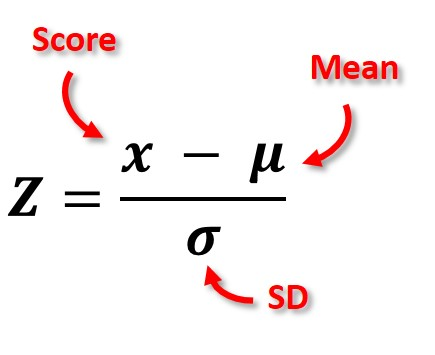

In [ ]:
# Z score
Image('/content/Z-score-formula.jpeg', width=200)

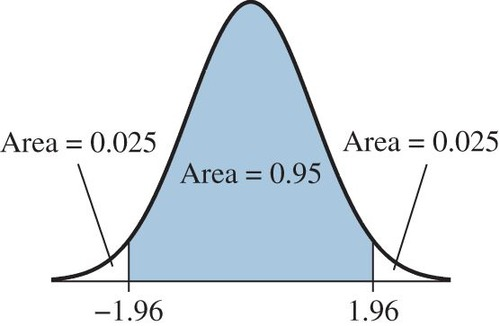

In [ ]:
# Significance level 0.05 for a two tailed test. It corresponds to a Z of 1.96 (probability of 0.95+0.025=0.975 in the Z table)
#
Image('/content/alpha_005.jpeg', width=200)

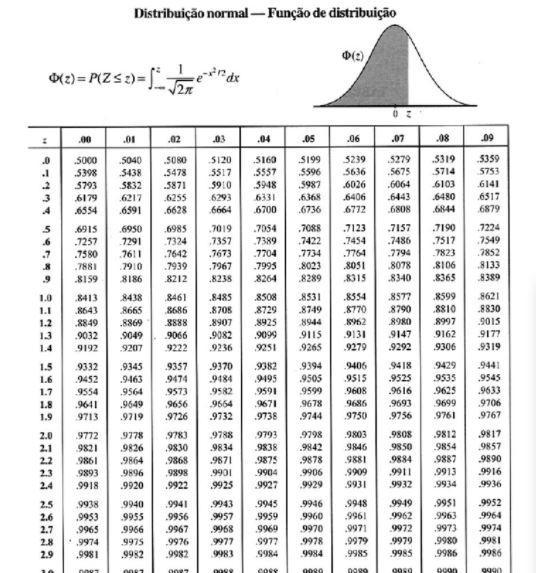

In [ ]:
# Z table
Image('/content/z_table.jpeg', width=500)

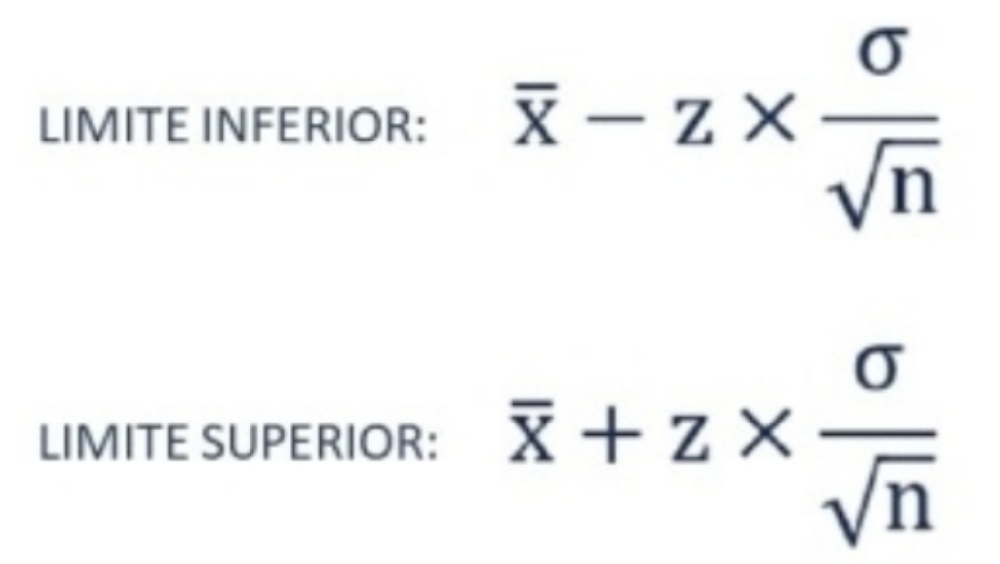

In [ ]:
# Confidence Interval for Mean
# Z is the Z value for the significance level. Usually the significance level is 0.05 (or 5%) and the correspondent Z is 1.96.
Image('/content/ci_mean.png', width=200)

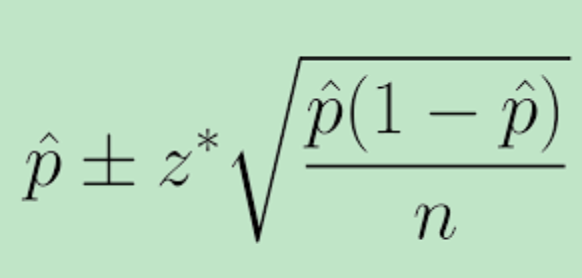

In [ ]:
# Confidence Interval for Proportion
Image('/content/ci_p.png', width=200)

# P value

P-value is the probability of an observed result assuming that the H0 is true.
In other words, it is the probability that your results occurred randomly given that the null hypothesis is true. 
We call **critical p-value** the probability of rejecting the null hypothesis given that it is true (error type I). Typically, this value is set at p = 0.05.
The smaller the p-value, the less likely it is that the null hypothesis is true and the greater the indication that it can be rejected. 

https://www.statology.org/p-value-from-z-score-by-hand/

# Hipothesis Tests

## Qui-Square for test statistical Independence

https://www.spss-tutorials.com/chi-square-independence-test/

The null hypothesis for a chi-square independence test is that
two categorical variables are independent in some population. 

For instance:
"is marital status related to education level and -if so- how?"


Expected frequencies are the frequencies we expect in a sample
if the null hypothesis is true. As the observed and expected frequencies differ, our data deviate more from independence. So how much do they differ? To answer this question, we subtract each expected frequency from each observed frequency, resulting in a residual. 

Larger residuals indicate a larger difference between our data and the null hypothesis. We should add up all residuals and then divide it by the expected value to obtain the x^2 number. It summarizes the difference between our data and our independence hypothesis.

After you find the xˆ2 number, it is time to assess the probability of finding it. If the assumptions below are met, so you your data follow a  χ2 distribution. It distribution can be used to find the probability.

Assumptions:

- independent observations
- for a 2 by 2 table, all expected frequencies > 5
- for a larger table, all expected frequencies > 1 and no more than 20% of all cells may have expected frequencies < 5.

The variables are perfectly independent: χ2 = 0


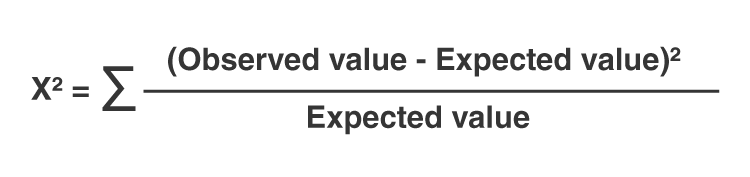

In [ ]:
from IPython.display import Image

Image('/content/Chi-Square-Test.png', width=400)

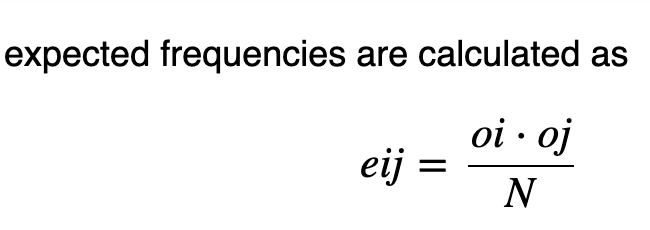

In [ ]:
# Expected frequencies
# eij is an expected frequency
# oi is a marginal column frequency
# oj is a marginal row frequency
# N is the total sample size
Image('/content/expected.png', width=300)

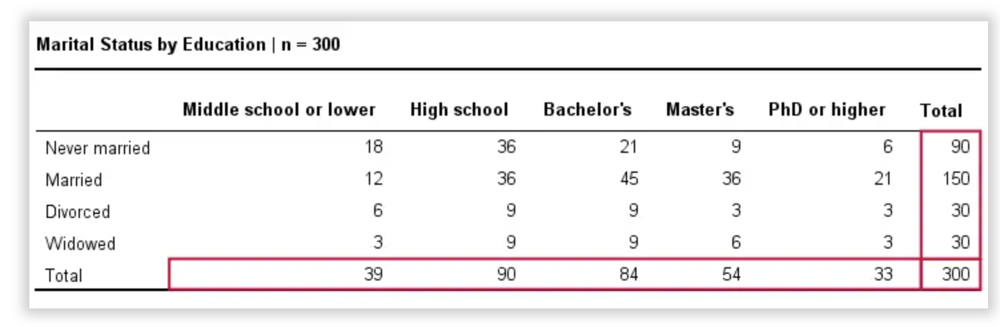

In [ ]:
# Example of contingency table
Image('/content/contingency.png', width=500)

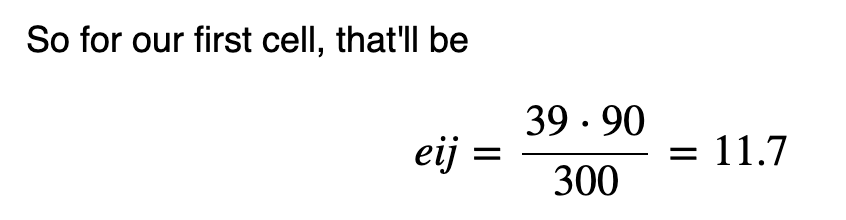

In [ ]:
# Example of expected value calculation
Image('/content/expected_example.png', width=300) 

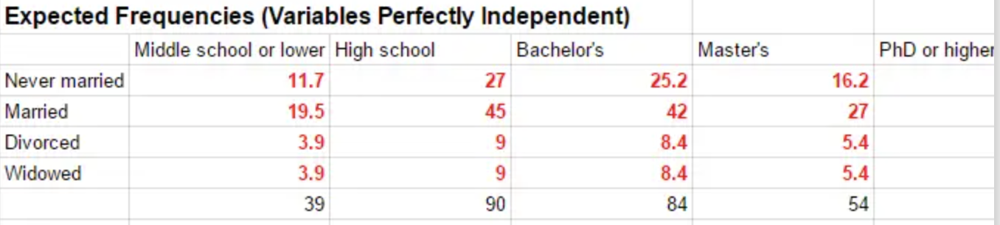

In [ ]:
# Contingency table with the expected values
Image('/content/expected_contingency_table.png', width=500) 

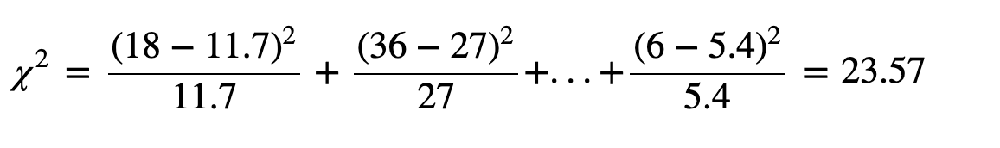

In [ ]:
# apply the test 
from IPython.display import Image
Image('/content/chi-square.png', width=500) 

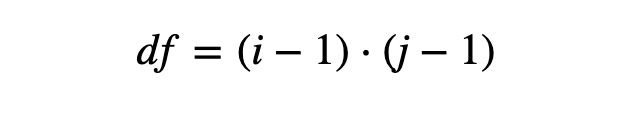

In [ ]:
# Lets check the probability
# Its is necessary to use a degree of freedom (basically a number that determines the exact shape of our distribution):
# i: is the number of rows in our contingency table and
# j: is the number of columns
Image('/content/df.png', width=300) 
# for the sample data the df is (5-1)*(4-1) = 12

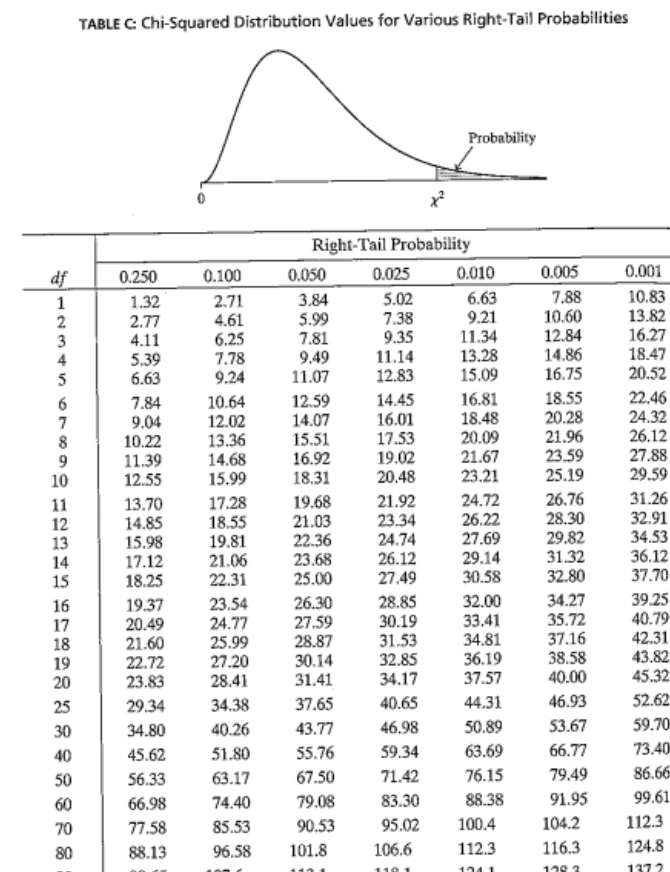

In [ ]:
# chi-square distribution table 
Image('/content/chi-square-table.png', width=400) 

In [ ]:
# it corresponds to χ2 ≥ 23.57 ≈ 0.023 ou 2.3%
# Since this is a small probability, we no longer believe our null hypothesis of our 
# variables marital status and education being independent in our population

### Effect Size (Cramér’s V)

It measure the strength of the association.
It can be calculate by Cramér’s V, what results in a number between 0 and 1.
Values close to zero indicates a very weak association.

https://www.spss-tutorials.com/cramers-v-what-and-why/

Alternatives:

For two ordinal variables, a Spearman correlation or Kendall’s tau are preferable over Cramér’s V.

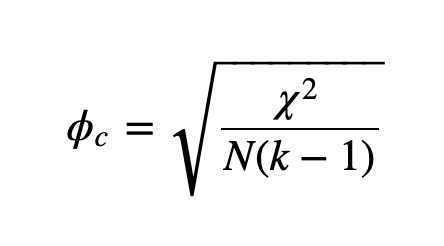

In [ ]:
# χ2: the Pearson chi-square statistic from the aforementioned test;
# N: the sample size involved in the test 
# k: the lesser number of categories of either variable
Image('/content/cramer_v.png', width=200) 

In [ ]:
# In the example, there are 4 categories for marital status e 5 for education. So we get the less that is 4.
# applying the Cramer test:
from math import *
cram_v = sqrt(23.57/(300*(4-1)))
cram_v

0.16182981458584475

### Example using scipy

In [ ]:
import scipy.stats as stats
import numpy as np
from scipy.stats import chi2
  
# 4 x 5 contingency table
dataset = np.array([[18, 36, 21, 9, 6],
                    [12, 36, 45, 36, 21],
                    [6, 9, 9, 3, 3],
                    [3, 9, 9, 6, 3]])
  
# Chi-squared test statistic
X2 = stats.chi2_contingency(dataset, correction=False)[0]
N = np.sum(dataset)
minimum_dimension = min(dataset.shape)
degrees_freedom = (dataset.shape[0] - 1) * (dataset.shape[1] - 1) 
p_value = chi2.sf(X2, degrees_freedom)
print('x^2:', X2)
print('N:', N)
print('minimum_dimension:', minimum_dimension)
print('degrees_freedom: ', degrees_freedom)
print('p-value:', p_value)

# Calculate Cramer's V (strength of association)
cram_v = np.sqrt(X2 / (N*(minimum_dimension - 1)) )
print('cram_v:', cram_v)

x^2: 23.56689976689977
N: 300
minimum_dimension: 4
degrees_freedom:  12
p-value: 0.023281019557072378
cram_v: 0.16181917125434858


## Z-Test

Z-test is a statistical method to determine whether the distribution of the test statistics can be approximated by a normal distribution. It is the method to determine whether two sample means are approximately the same or different when their variance is known and the sample size is large (should be >= 30).

The sample size should be greater than 30. Otherwise, we should use the t-test.
Samples should be drawn at random from the population.
The standard deviation of the population should be known
Samples that are drawn from the population should be independent of each other.
The data should be normally distributed, however for large sample size, it is assumed to have a normal distribution (central limit theorem).


http://www.leg.ufpr.br/lib/exe/fetch.php/disciplinas:ce001:teste_z_-_para_apresentar.pdf 

https://www.geeksforgeeks.org/z-test/

Passos:

Estabeleça o nível de significância desejado (ex. 0.05). Esse é o erro de tipo I (rejeitar H0, quando esta é verdadeira). 
Se for bicaudal, divida esse valor por 2 (por exemplo 0.05/2=0.025) e este será o valor das extremidades da curva normal. Agora, encontre o correspondente valor Z. Para 0.05/2 é 1,96 (z crítico).

Em seguida calcule o valor Z dos seus dados da amostra e compare com o z crítico. Se o módulo do valor calculado for maior que o z crítico, então rejeita-se a hipótese nula.

Calcule:

Z = (x - media)/ (desvio-padrao populacional/raiz N)

Se for proporção:

Z = (p^ - p)/ raiz(p(1-p)/N)

Você pode calcular o valor p, que corresponde a probabilidade correspondente a um subtraído da probabilidade do valor z calculado. Se o resultado for menor que o nível de significância (ex. 0.05). Então, rejeita-se H0.

In [ ]:
from statsmodels.stats.weightstats import ztest as ztest
#https://www.statsmodels.org/dev/generated/statsmodels.stats.weightstats.ztest.html

data = [88, 92, 94, 94, 96, 97, 97, 97, 99, 99,
        105, 109, 109, 109, 110, 112, 112, 113, 114, 115]

# one sample z-test
test, p_value = ztest(data, value=100)
print('z statistic', test, 'p-value', p_value)

alpha =0.05

if(p_value <  alpha):
  print("Reject Null Hypothesis")
else:
  print("Fail to Reject NUll Hypothesis")

z statistic 1.5976240527147705 p-value 0.1101266701438426
Fail to Reject NUll Hypothesis


In [ ]:
from statsmodels.stats.proportion import proportions_ztest

test = proportions_ztest(count=17, nobs=30, value=0.40)
print('z statistic', test[0], 'p-value', test[1])

z statistic 1.8421903154590296 p-value 0.0654473165410927


In [ ]:
# two samples z=test

from statsmodels.stats.weightstats import ztest as ztest

# groups
cityA = [82, 84, 85, 89, 91, 91, 92, 94, 99, 99,
         105, 109, 109, 109, 110, 112, 112, 113, 114, 114]

cityB = [90, 91, 91, 91, 95, 95, 99, 99, 108, 109,
         109, 114, 115, 116, 117, 117, 128, 129, 130, 133]

#two sample z-test
test = ztest(cityA, cityB, value=0) 
print('z statistic', test[0], 'p-value', test[1])

z statistic -1.9953236073282115 p-value 0.046007596761332065


## T-Test

Compara duas médias de dois grupos

A variável dependente deve ter distribuição normal.

H0: média do grupo A = média do grupo B
H1: média do grupo A ≠ média do grupo B

### Independent Samples

Os grupos podem ter sido formados de duas maneiras diferentes:
- Extraiu-se uma amostra da população A e outra amostra da
população B
- Indivíduos distintos da mesma população foram alocados
aleatoriamente a um dos dois tratamentos em estudo

O teste-t independente apresenta dois pressupostos:

- Normalidade da variável dependente em cada grupo. Pode ser avaliada pelo teste de Shapiro Wilk.
- Homogeneidade de variâncias (ou seja, grupos com variâncias homogêneas). Pode ser avaliada pelo teste de Levene

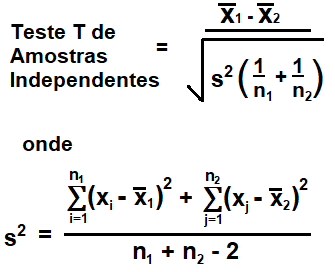

In [ ]:
from IPython.display import Image
Image('t-test.png', width=300) 

In [ ]:
# example using python

import numpy as np
import scipy.stats as stats


group1 = np.array([14, 15, 15, 16, 13, 8, 14, 17, 16, 14, 19, 20, 21, 15, 15, 16, 16, 13, 14, 12])
group2 = np.array([15, 17, 14, 17, 14, 8, 12, 19, 19, 14, 17, 22, 24, 16, 13, 16, 13, 18, 15, 13])

# equal_var: 
# - if True: perform a standard independent 2 sample t-test that assumes equal population variances. 
# - if False: perform Welch’s t-test, which does not assume equal population variances. This is True by default.

# two sample t-test with equal variances
stats.ttest_ind(a=group1, b=group2, equal_var=True)

Ttest_indResult(statistic=-0.6337397070250238, pvalue=0.5300471010405257)

### Paired Samples

Observações diferentes de um mesmo indivíduo/objeto.
Por exemplo, medições do tempo de uma variável de um paciente antes e depois de aplicar determinado tratamento. Também é usada em estudos feitos com gêmeos.

http://www.leg.ufpr.br/lib/exe/fetch.php/disciplinas:ce001:testes_t_pareado-1.pdf

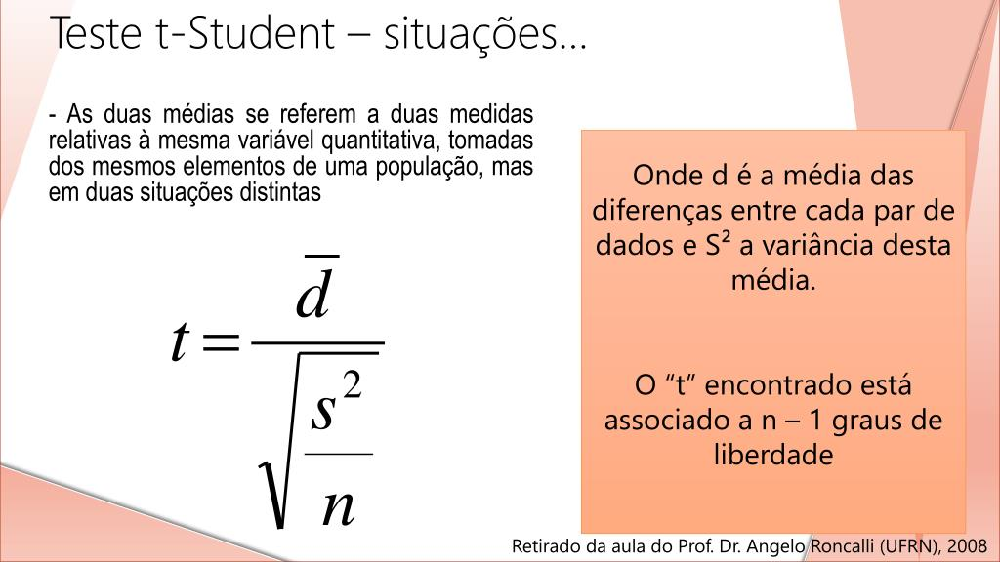

In [ ]:
from IPython.display import Image
Image('t-test-paired.jpeg', width=400) 

In [ ]:
# example using python
import scipy.stats as stats

pre = [88, 82, 84, 93, 75, 78, 84, 87, 95, 91, 83, 89, 77, 68, 91]
post = [91, 84, 88, 90, 79, 80, 88, 90, 90, 96, 88, 89, 81, 74, 92]

#perform the paired samples t-test
print(stats.ttest_rel(pre, post))

TtestResult(statistic=-2.9732484231168796, pvalue=0.01007144862643272, df=14)


## ANOVA (Analysis of Variance)

Permite comparar três ou mais grupos.

Compara variação dentros dos grupos e entre grupos.

Pode-se incluir mais de um fator para comparar os grupos. Por exemplo, se incluirmos "sexo", teremos um ANOVA de 2 fatores (Feminino e Masculino) para os grupos. 

Two-ways ANOVA

https://www.statology.org/two-way-anova-by-hand/



#### F-Test

O ANOVA se baseia no teste F para comparação de variâncias.

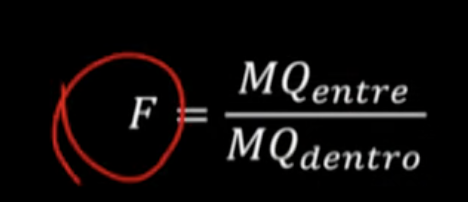

In [ ]:
Image('f.png', width=200) 

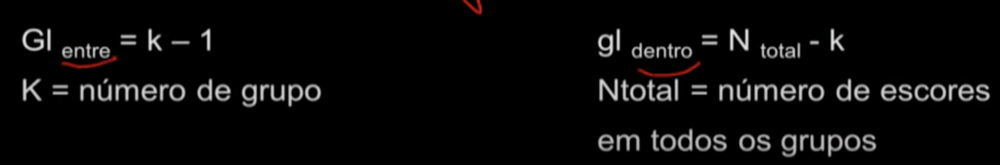

In [ ]:
# Uma vez calculado o F, é preciso calcular os graus de liberdade entre grupos e dentro dos grupos
# entre grupos: número de grupos - 1
# dentro dos grupos: total de elementos considerando todos os grupos (NTotal) - número de grupos
Image('/content/anova_df.png', width=400) 


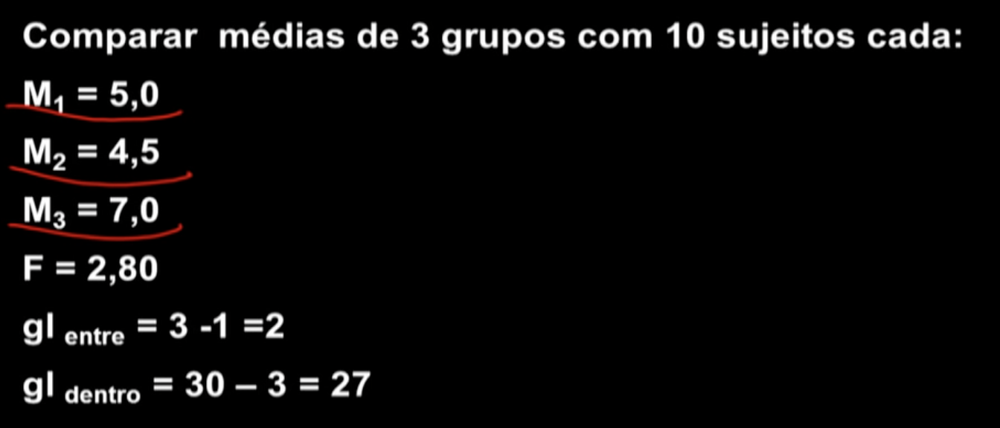

In [ ]:
# Exemplo do cálculo dos cálculos
# Tendo esses valores calculados, pode-se consultar na tabela do Anova o F crítico para o nível de significância desejado 
# Na tabela, deve-se cruzar os valores de gl entre e gl dentro para obter o valor crítico de F
# https://www.statology.org/f-distribution-table/
Image('/content/anova.png', width=300) 

#### One-way ANOVA Step by Step

https://www.statology.org/one-way-anova-by-hand/

1) Calculate the mean for each group and the overall mean

2) Calculate SSR (sum of squares): Σ (group number of elements * (the mean of group – overall mean)2 ). Apply this formula for each group and, at the end, sum all results.

3) Calculate SSE (error sum of squares): Σ(group observation – mean of the group)2 . Apply this formula for each group and, at the end, sum all results.

4) Calculate SST (total sum of squares): SST = SSR + SSE

5) Calculate the degrees of freedom:

For n = total observations and k = number of groups:

- df treatment: k-1 (among groups)
- df error: n-k (inside the groups)
- df total: n-1

6) Calculate de Mean Squares (MS):

- MS treatment (among groups): SST / df treatment
- MS error (inside groups): SSE / df error 

7) Calculate the F statistic:

- F = MS treatment / MS error

8) Check the F distribution table to find the critical F. If the calculated F  is less than the F critical value in the F distribution table, we fail to reject the null hypothesis. 

https://www.statology.org/f-distribution-table/

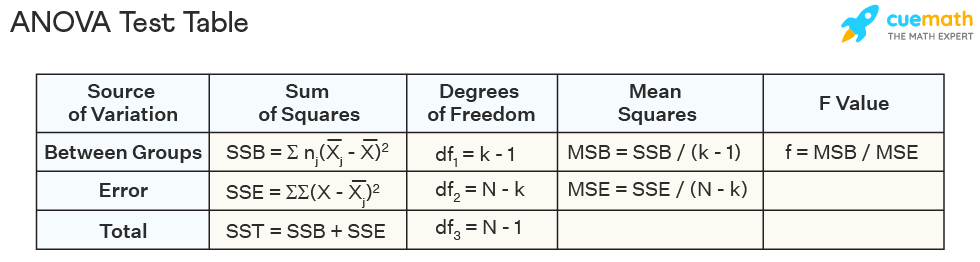

In [ ]:
# Anova test table
Image('/content/anova_test_table.png', width=600) 

#### Tukey Test

O ANOVA diz se existe ou não diferença entre os tratamentos, porém não permite identificar quais tratamentos são os responsáveis pela diferença. O teste de Tukey permite identificá-los.

The test compares all possible pairs of means.

Tukey’s test is denoted q and is essentially a modified t-statistic that corrects for multiple comparison.

Uma alternativa é o Scheffe test.

For groups of different size see Tukey-Kramer test.

http://www.statisticslectures.com/topics/posthoconewayanova/ 

https://www.statisticshowto.com/studentized-range-distribution/#qtable

http://www.statisticslectures.com/tables/qtable/

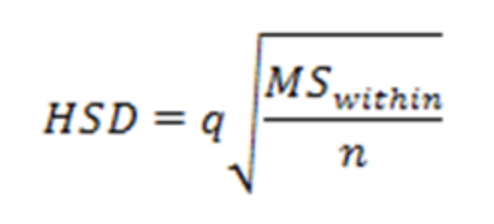

In [ ]:
Image('/content/hsd.png', width=300) 

In [ ]:
from statsmodels.stats.multicomp import MultiComparison, pairwise_tukeyhsd
# https://www.statsmodels.org/dev/generated/statsmodels.sandbox.stats.multicomp.MultiComparison.tukeyhsd.html
# http://jpktd.blogspot.com/2013/03/multiple-comparison-and-tukey-hsd-or_25.html

mc = MultiComparison(df['variavel1'], df['variavel2'])
tukey_test = mc.tukeyhsd()

#### One-way ANOVA using scipy

In [ ]:
from scipy.stats import f_oneway

group1 = [89, 89, 88, 78, 79]
group2 = [93, 92, 94, 89, 88]
group3 = [89, 88, 89, 93, 90]
group4 = [81, 78, 81, 92, 82]

# one-way ANOVA. It returns the p-value and the F statistic.
anova = f_oneway(group1, group2, group3, group4)
anova

F_onewayResult(statistic=4.625000000000002, pvalue=0.016336459839780215)

#### Two-way ANOVA using scipy

In [ ]:
# https://towardsdatascience.com/two-way-anova-test-with-python-a112e2396d78

import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
  
dataframe = pd.DataFrame({'Fertilizer': np.repeat(['daily', 'weekly'], 15),
                          'Watering': np.repeat(['daily', 'weekly'], 15),
                          'height': [14, 16, 15, 15, 16, 13, 12, 11, 14, 
                                     15, 16, 16, 17, 18, 14, 13, 14, 14, 
                                     14, 15, 16, 16, 17, 18, 14, 13, 14, 
                                     14, 14, 15]})

dataframe.head()
  
# Two-way ANOVA
model = ols(
    'height ~ C(Fertilizer) + C(Watering) + C(Fertilizer):C(Watering)', data=dataframe).fit()

result = sm.stats.anova_lm(model, type=2)

print(result)

                             df     sum_sq   mean_sq         F    PR(>F)
C(Fertilizer)               1.0   0.033333  0.033333  0.012069  0.913305
C(Watering)                 1.0   0.000369  0.000369  0.000133  0.990865
C(Fertilizer):C(Watering)   1.0   0.040866  0.040866  0.014796  0.904053
Residual                   28.0  77.333333  2.761905       NaN       NaN


# Errors

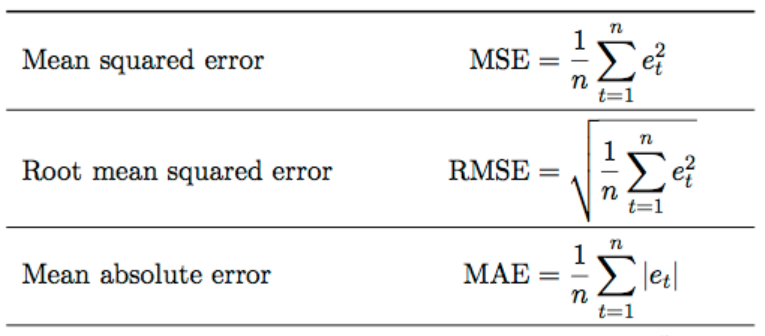

In [ ]:
Image('/content/errors.png', width=400)

## ME (Mean Error)

Média da diferença entre previsto e realizado.

Dependente de escala.

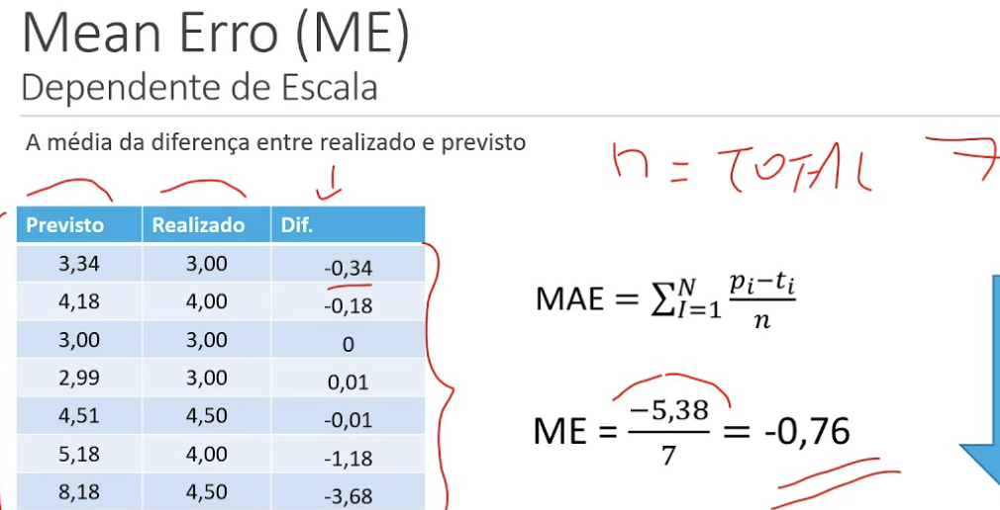

In [ ]:
from IPython.display import Image
Image('/content/me.png', width=400)

## Mean Absolute Error (MAE)

Parecido com o ME, porém considera valores absolutos.

Dependente de escala.


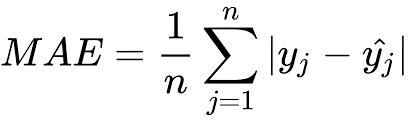

In [ ]:
Image('/content/mae.png', width=300)

## Root Mean Squared Error (RMSE)

Independente de escala.

Consiste em elevar as diferenças ao quadrado e, ao fim, tirar a raiz da soma dessas diferenças dividida pelo N.

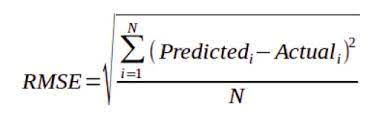

In [ ]:
Image('/content/rmse.jpeg', width=300)

## Mean Percentage Error (MPE)

Independente de escala.

Calcula-se a diferença entre previsto e realizado. Em seguida, esse valor é dividido pelo previsto, para obter a proporção. Para obter em %, multiplica-se por 100/N

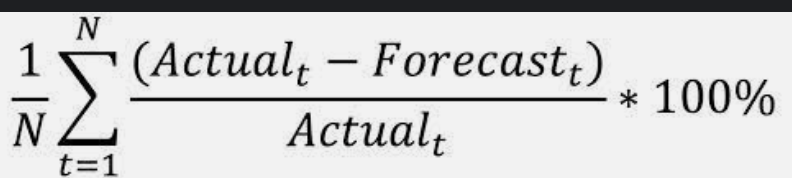

In [ ]:
Image('/content/Captura de Tela 2023-04-03 às 01.48.25.png', width=400)

## MAPE (Mean Absolute Percentage Error)

Parecido com o MPE, mas considera valores absolutos.

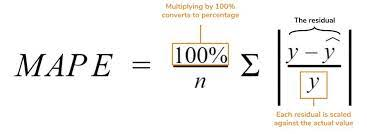

In [ ]:
Image('MAPE.jpeg', width=400)

# Regressions

## Linear Regression

Ao escolher por esse tipo de modelo, deve-se avaliar a correlação, o coeficiente de determinação e se os resíduos seguem um distribuição normal.

### Covariance

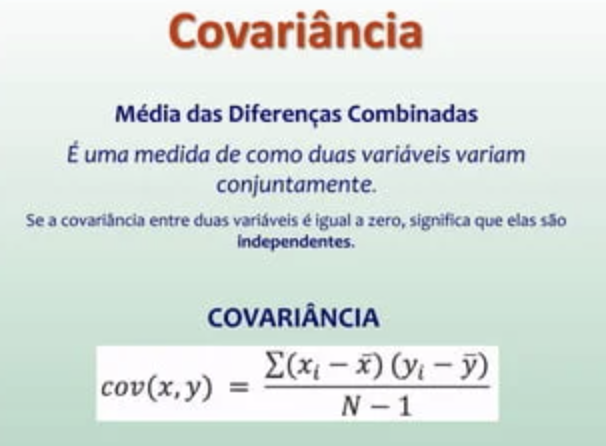

In [ ]:
Image('/content/Captura de Tela 2023-04-03 às 22.37.12.png', width=400)
# if population division is just by N

### Pearson Correlation

Varia entre -1 e 1.

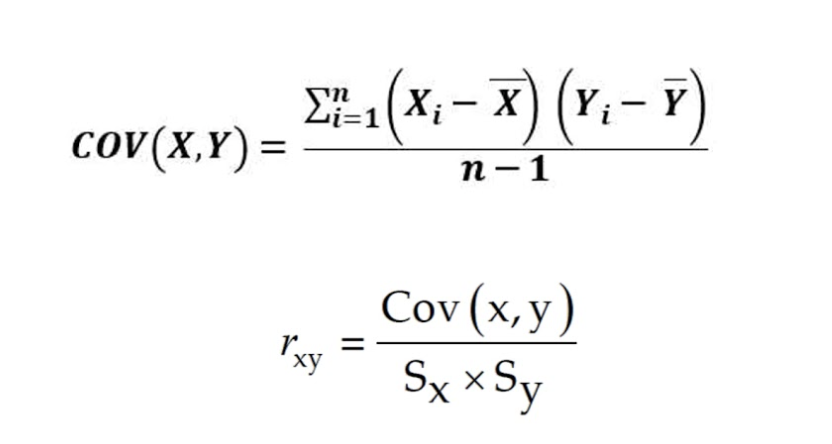

In [ ]:
Image('/content/Captura de Tela 2023-04-03 às 22.38.50.png', width=300)

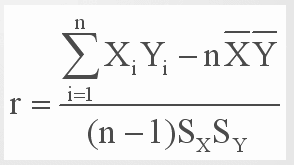

In [ ]:
# alternative formula
Image('/content/pearson_correlation.png', width=200)

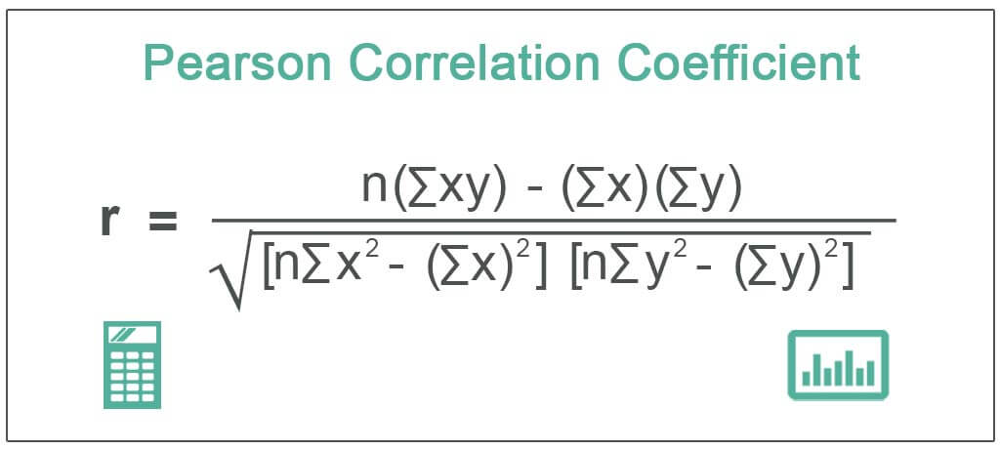

In [ ]:
# alternative formula
Image('/content/pearson_corr_2.jpeg', width=300)

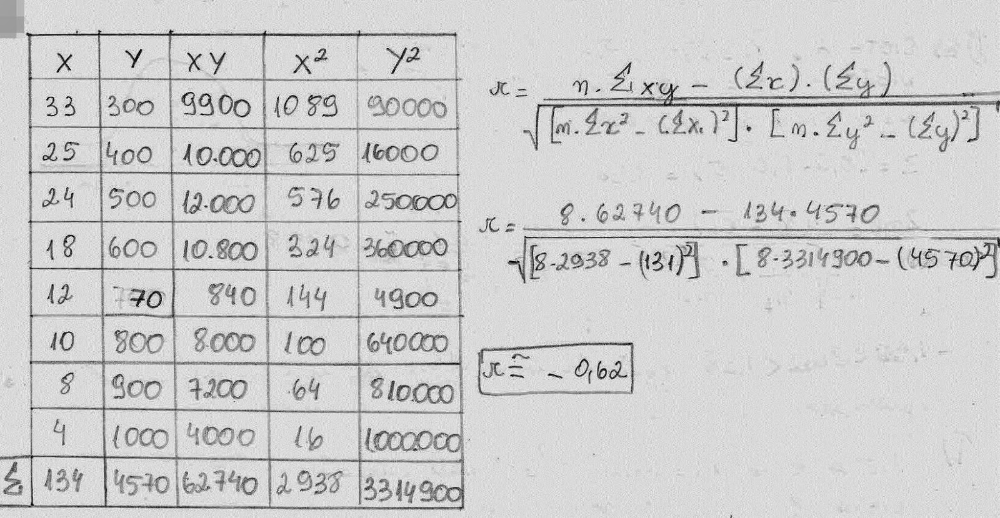

In [ ]:
Image('/content/example.jpeg', width=500)

### Coefficient of Determination (R²)

It measures how well a statistical model predicts an outcome. You can interpret the R² as the proportion of variation in the dependent variable that is predicted by the statistical model.
Varia entre 0 e 1.

O **R² ajustado** se refere a essa variável corrigida para múltiplas variáveis explanatórias, no caso de regressão múltipla.



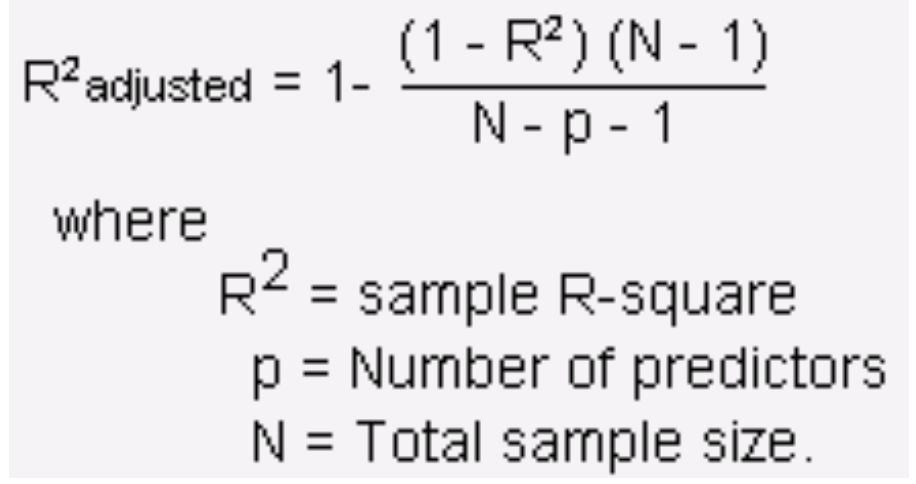

In [ ]:
Image('/content/Captura de Tela 2023-04-03 às 23.27.48.png', width=300)

In [ ]:
# correlatio with numpy
import numpy as np
import matplotlib.pyplot as plt

x = np.array([33, 25, 24, 18, 12, 10, 8, 4])
y = np.array([300, 400, 500, 600, 70, 800, 900, 1000])

# Compute Pearson correlation coefficient between two arrays.
r = np.corrcoef(x, y)

print('total x', x.sum())
print('total y', y.sum())
print('r', r[0,1])
print('r²', r[0,1]*r[0,1])

total x 134
total y 4570
r -0.6247651971888026
r² 0.3903315516183634


In [ ]:
# using sklearn
from sklearn import linear_model
from sklearn.metrics import r2_score
from math import sqrt

regr = linear_model.LinearRegression()
regr.fit(x.reshape(-1, 1), y.reshape(-1, 1))

print('Intercept:', regr.intercept_)
print('regression coefficient:', regr.coef_) # inclinacao
print('score:', regr.score(x.reshape(-1, 1), y.reshape(-1, 1))) # r squared 

predictions = regr.predict(x.reshape(-1, 1))

# r squared alternative calc
r_squared = r2_score(y, predictions)  
print('r:', sqrt(r_squared))
print('r_squared:', r_squared)

Intercept: [904.74044701]
regression coefficient: [[-19.90987743]]
score: 0.3903315516183633
r: 0.6247651971888025
r_squared: 0.3903315516183633


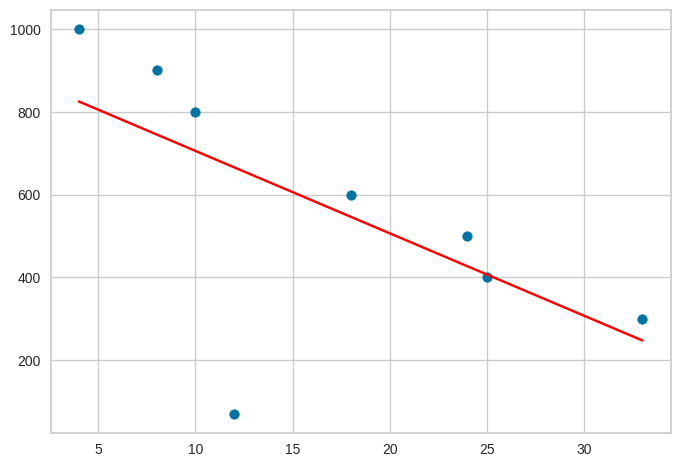

In [ ]:
plt.scatter(x,y)
plt.plot(x, predictions, color='red')

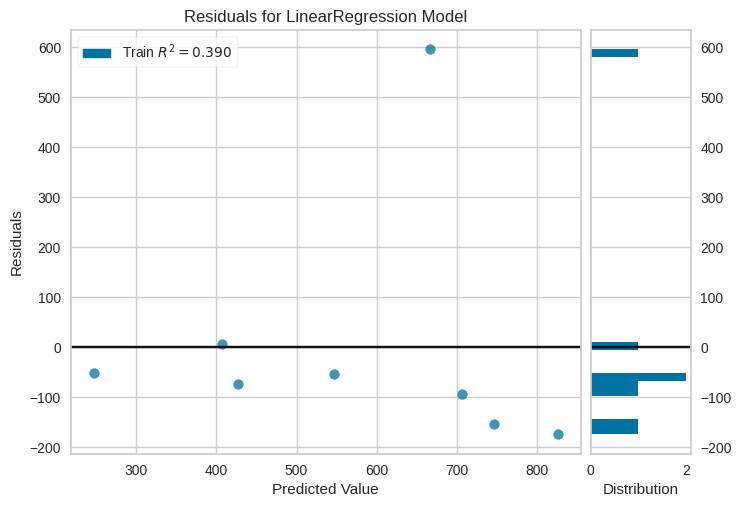

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [ ]:
# residual plot: util para verificar se os resíduos sao aleatórios e se seguem uma distribuiçao normal
from yellowbrick.regressor import ResidualsPlot
#https://www.scikit-yb.org/en/latest/api/regressor/residuals.html
residual_plot = ResidualsPlot(regr)
residual_plot.fit(x.reshape(-1, 1), y.reshape(-1, 1))
residual_plot.poof()

## Multiple Linear Regression

Considera simultaneamente várias variáveis explanatórias para prever uma variável dependente.

É preciso se atentar para colinearidades (variáveis explanatórias altamente correlacionadas que podem gerar viéses. Assim, deve-se usar apenas variáveis explanatórias independentes umas das outras.

Outro ponto é usar parcimônia, isto é, não colocar variáveis que não melhoram o modelo.


In [ ]:
import pandas

df = pandas.read_csv("data.csv")
df.head()

,Car,Model,Volume,Weight,CO2
0,Toyoty,Aygo,1000,790,99
1,Mitsubishi,Space Star,1200,1160,95
2,Skoda,Citigo,1000,929,95
3,Fiat,500,900,865,90
4,Mini,Cooper,1500,1140,105


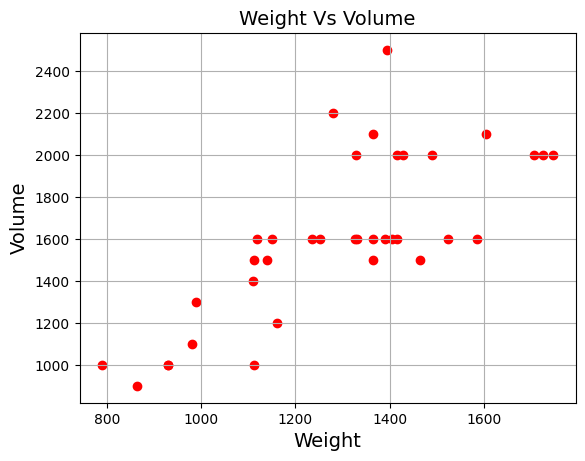

In [ ]:
import matplotlib.pyplot as plt

# check for colinearity
plt.scatter(df['Weight'], df['Volume'], color='red')
plt.title('Weight Vs Volume', fontsize=14)
plt.xlabel('Weight', fontsize=14)
plt.ylabel('Volume', fontsize=14)
plt.grid(True)
plt.show()

In [ ]:
from sklearn import linear_model
from sklearn.metrics import r2_score

#It is common to name the list of independent values with a upper case X, and the list of dependent values with a lower case y
X = df[['Weight', 'Volume']] 
y = df['CO2'] 

regr = linear_model.LinearRegression()
regr.fit(X, y)

print('Intercept:', regr.intercept_)

# regression coefficients for weight and volume
# these values tell us that if the weight increase by 1kg, the CO2 emission increases by 0.00755095g.
# And if the volume increases by 1 cm3, the CO2 emission increases by 0.00780526 g.
print('regression coefficient:', regr.coef_) # inclinacao

predictions = regr.predict(X)
r_squared = r2_score(y, predictions)  # First R-Squared
r_squared_adjusted = 1 - ( ( (1-r_squared)*(len(y)-1) ) / ( len(y) - len(X.columns) - 1 ) )
print('r_squared:', r_squared)
print('r_squared_adjusted:', r_squared_adjusted)

# predict the CO2 emission of a car where the weight is 2300kg, and the volume is 1300cm3:
predictedCO2 = regr.predict([[2300, 1300]])
print('Prediction:', predictedCO2)

# Regression Function:
# CO2_emission = (intercept) + (interest_rate coef)*X1 + (unemployment_rate coef)*X2

Intercept: 79.69471929115939
regression coefficient: [0.00755095 0.00780526]
r_squared: 0.3765564043619989
r_squared_adjusted: 0.33877194402030186
Prediction: [107.2087328]


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [ ]:
# Its also possible to use statsmodel library
# it brings additional insights about the model 
import statsmodels.api as sm

x = sm.add_constant(X) # An intercept is not included by default and should be added by the user. 
model = sm.OLS(y, x).fit()
predictions = model.predict(x) 
 
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    CO2   R-squared:                       0.377
Model:                            OLS   Adj. R-squared:                  0.339
Method:                 Least Squares   F-statistic:                     9.966
Date:                Tue, 04 Apr 2023   Prob (F-statistic):           0.000411
Time:                        02:20:12   Log-Likelihood:                -114.39
No. Observations:                  36   AIC:                             234.8
Df Residuals:                      33   BIC:                             239.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         79.6947      5.564     14.322      0.000      68.374      91.016
Weight         0.0076      0.006      1.173      0.249      -0.006       0.021
Volume         0.0078      0.004      1.948      0.060      -0.000       0.016
==============================================================================
Omnibus:                        4.957   Durbin-Watson:                   0.944
Prob(Omnibus):                  0.084   Jarque-Bera (JB):                1.836
Skew:                          -0.025   Prob(JB):                        0.399
Kurtosis:                       1.895   Cond. No.                     1.16e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.16e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Logistic Regression

Nesse tipo de regressão a variável resposta é binária (sim/nao), sendo o sim ou nao representado por meio de probabilidades. A probabilidade é convertida em valor absoluto (0 ou 1). Por exemplo, se a probabilidade for abaixo de 0,5 torna-se 0, se acima, torna-se 1.
Pode ser simples ou múltipla.

In [14]:
import numpy
from sklearn import linear_model

X = numpy.array([3.78, 2.44, 2.09, 0.14, 1.72, 1.65, 4.92, 4.37, 4.96, 4.52, 3.69, 5.88]).reshape(-1,1) # variavel resposta (tumor size)
y = numpy.array([0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]) # sucesso ou fracasso (canceroso ou nao canceroso)

logr = linear_model.LogisticRegression()
logr.fit(X,y)

#predict if tumor is cancerous where the size is 3.46mm:
predicted = logr.predict(numpy.array([3.46]).reshape(-1,1))
print('predicted', predicted)

score = logr.score(X, y)
print('score', score)

# https://www.youtube.com/watch?v=ARfXDSkQf1Y
# coefficient: is the expected change in log-odds of having the outcome per unit change in X
# Odds are the probability of success divided by the probability of failure: odds = p/(1-p)
# Log-odds is simply the logarithm of odds
# obtain the log-odds for a given probability by taking the natural logarithm of the odds
log_odds = logr.coef_
odds = numpy.exp(log_odds) # exp() allows users to calculate the exponential value with the base set to e
print('log_odds', log_odds, 'odds', odds)

intercept = logr.intercept_
print('intercept', intercept)

# The coefficient and the intercept values can be used to find the probability that each tumor is cancerous.
# For instance: probability that a tumor with the size 3.78cm is cancerous is 61%.
# https://yury-zablotski.netlify.app/post/from-odds-to-probability/
def logit2prob(logr, X):
  log_odds = logr.coef_ * X + logr.intercept_
  odds = numpy.exp(log_odds)
  probability = odds / (1 + odds) 
  return(probability)

print('probability', logit2prob(logr, X))

predicted [0]
score 0.9166666666666666
log_odds [[1.39510954]] odds [[4.03541657]]
intercept [-4.83670029]
probability [[0.60749955]
 [0.19268876]
 [0.12775886]
 [0.00955221]
 [0.08038616]
 [0.07345637]
 [0.88362743]
 [0.77901378]
 [0.88924409]
 [0.81293497]
 [0.57719129]
 [0.96664243]]


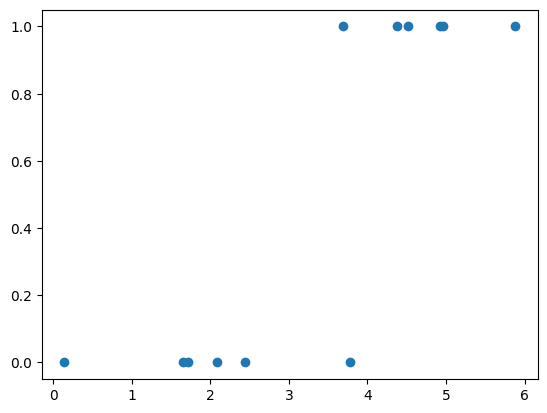

In [8]:
import matplotlib.pyplot as plt

plt.scatter(X, y)